In [241]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from sklearn.model_selection import ParameterGrid
import statsmodels.api as sm
from linearmodels.panel import PooledOLS
from statsmodels.tsa.stattools import adfuller

Stationary geocodes: [3300100, 3300159, 3300209, 3300225, 3300233, 3300258, 3300308, 3300407, 3300456, 3300506, 3300605, 3300704, 3300803, 3300902, 3300936, 3300951, 3301009, 3301108, 3301157, 3301207, 3301306, 3301405, 3301504, 3301603, 3301702, 3301801, 3301850, 3301876, 3301900, 3302007, 3302056, 3302106, 3302205, 3302254, 3302270, 3302304, 3302403, 3302452, 3302502, 3302601, 3302700, 3302809, 3302908, 3303005, 3303104, 3303203, 3303302, 3303401, 3303500, 3303609, 3303708, 3303807, 3303856, 3303906, 3303955, 3304003, 3304102, 3304110, 3304128, 3304144, 3304151, 3304201, 3304300, 3304409, 3304508, 3304524, 3304557, 3304607, 3304706, 3304755, 3304805, 3304904, 3305000, 3305109, 3305133, 3305158, 3305208, 3305307, 3305406, 3305505, 3305554, 3305604, 3305703, 3305752, 3305802, 3305901, 3306008, 3306107, 3306156, 3306206, 3306305]
Non-stationary geocodes: []
Train data shape: (42588, 3)
Test data shape: (9464, 3)
                          PooledOLS Estimation Summary                     

C:\Users\user\AppData\Local\Temp\ipykernel_21644\1268868658.py:108: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'cases_lag1': [float(forecast_week1)],
C:\Users\user\AppData\Local\Temp\ipykernel_21644\1268868658.py:108: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'cases_lag1': [float(forecast_week1)],
C:\Users\user\AppData\Local\Temp\ipykernel_21644\1268868658.py:108: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'cases_lag1': [float(forecast_week1)],
C:\Users\user\AppData\Local\Temp\ipykernel_21644\1268868658.py:108: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  'cases_lag1': [float(forecast_w

      geocode       date                                    predicted_cases  \
0     3300100 2021-01-03  predictions   -0.580401
Name: (3300100, 2021-0...   
1     3300100 2021-01-10  predictions   -0.377867
Name: (3300100, 2021-0...   
2     3300100 2021-01-17  predictions   -0.039773
Name: (3300100, 2021-0...   
3     3300100 2021-01-24  predictions    0.440638
Name: (3300100, 2021-0...   
4     3300100 2021-01-31  predictions    0.500854
Name: (3300100, 2021-0...   
...       ...        ...                                                ...   
9459  3306305 2022-11-27  predictions    0.440638
Name: (3306305, 2022-1...   
9460  3306305 2022-12-04  predictions    1.474217
Name: (3306305, 2022-1...   
9461  3306305 2022-12-11  predictions    2.192176
Name: (3306305, 2022-1...   
9462  3306305 2022-12-18  predictions    3.528834
Name: (3306305, 2022-1...   
9463  3306305 2022-12-25  predictions    4.76222
Name: (3306305, 2022-12...   

      actual_cases  
0              1.0  
1        

C:\Users\user\AppData\Local\Temp\ipykernel_21644\1268868658.py:143: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  print(f"Mean Absolute Error: {predicted_df['abs_error'].mean():.2f}")


Mean Absolute Error: 2.27


C:\Users\user\AppData\Local\Temp\ipykernel_21644\1268868658.py:144: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  print(f"Root Mean Squared Error: {np.sqrt(predicted_df['squared_error'].mean()):.2f}")
C:\Users\user\AppData\Roaming\Python\Python312\site-packages\matplotlib\cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)
C:\Users\user\AppData\Roaming\Python\Python312\site-packages\matplotlib\cbook.py:1398: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return np.asarray(x, float)


Root Mean Squared Error: 5.92


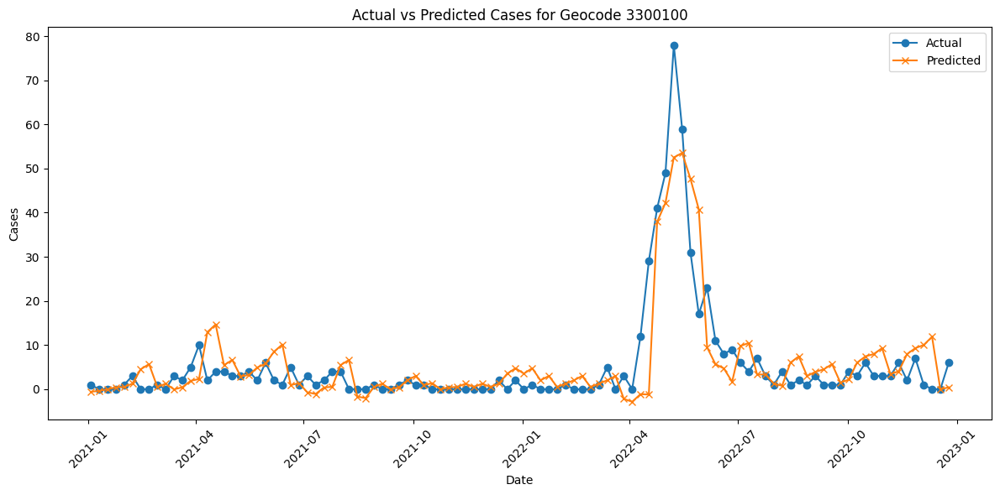

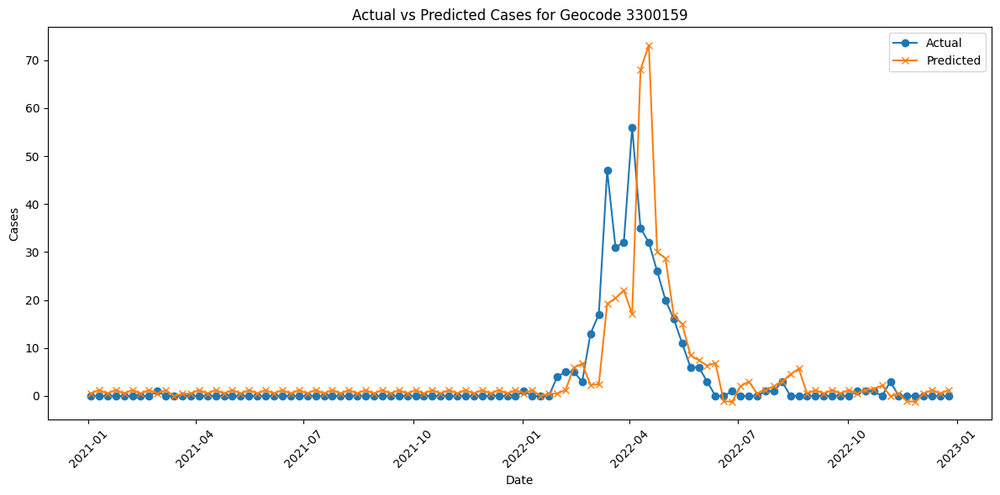

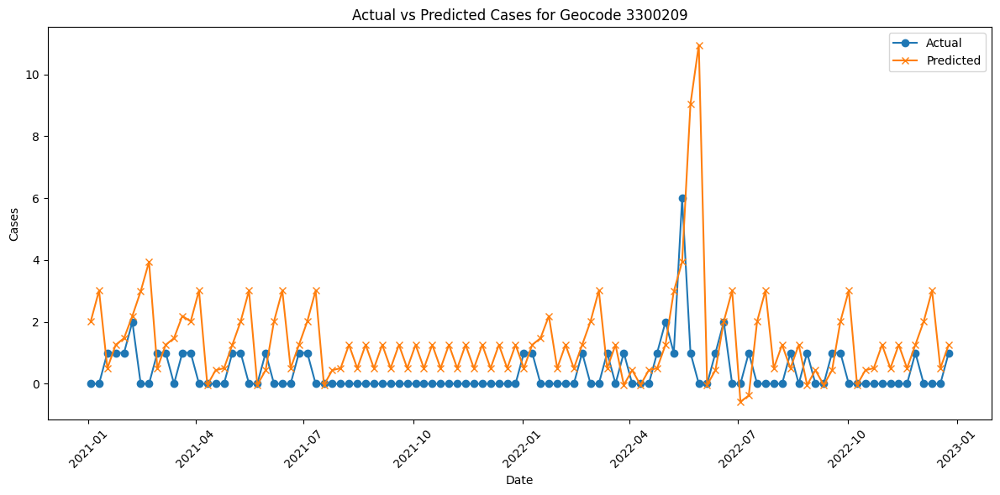

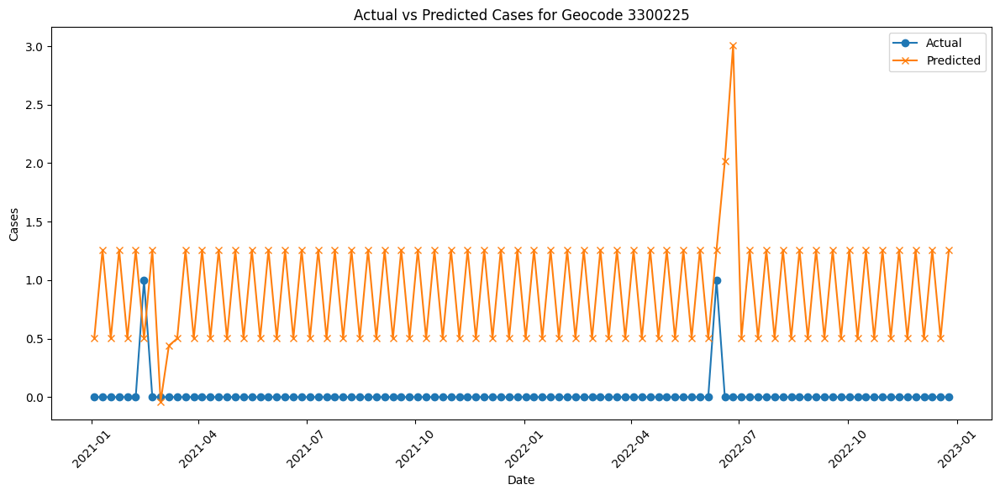

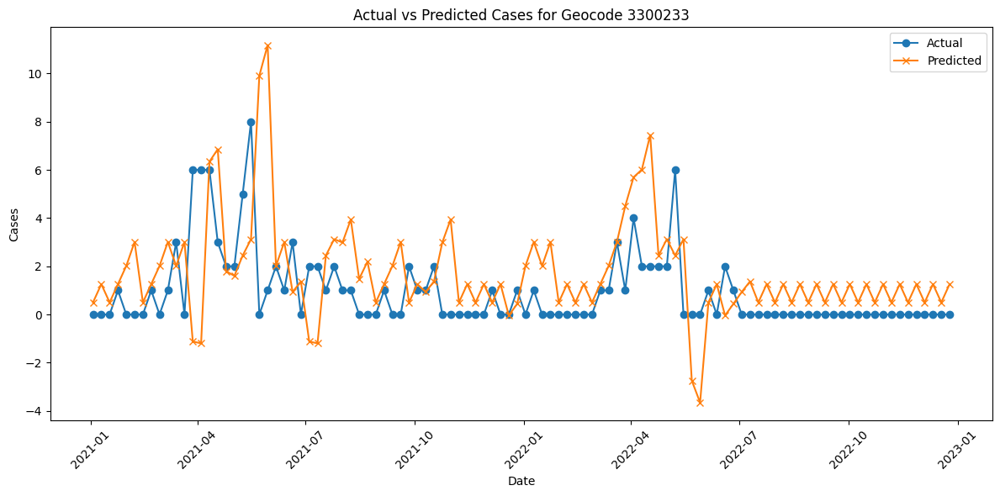

...

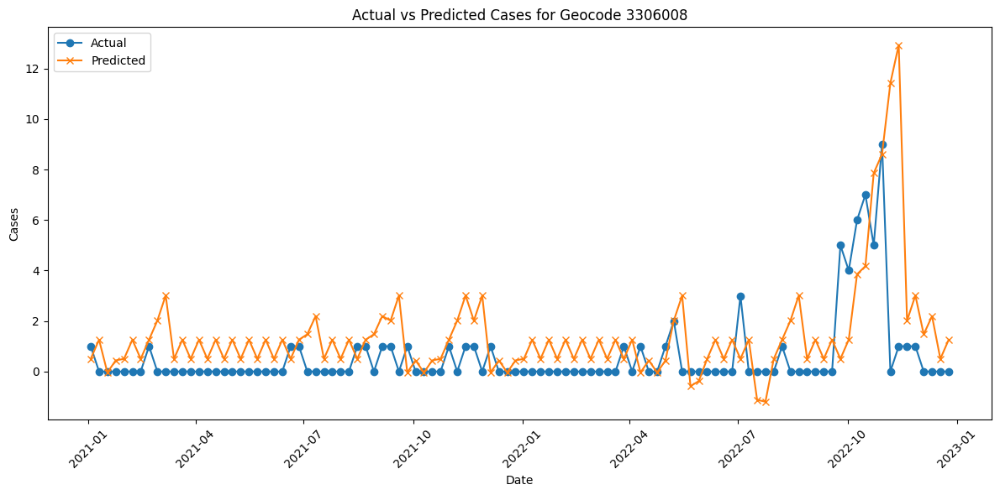

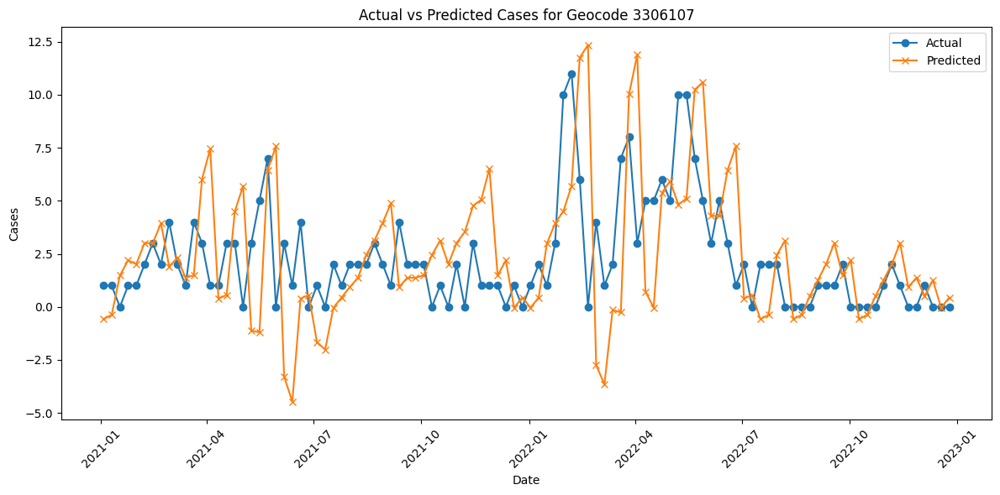

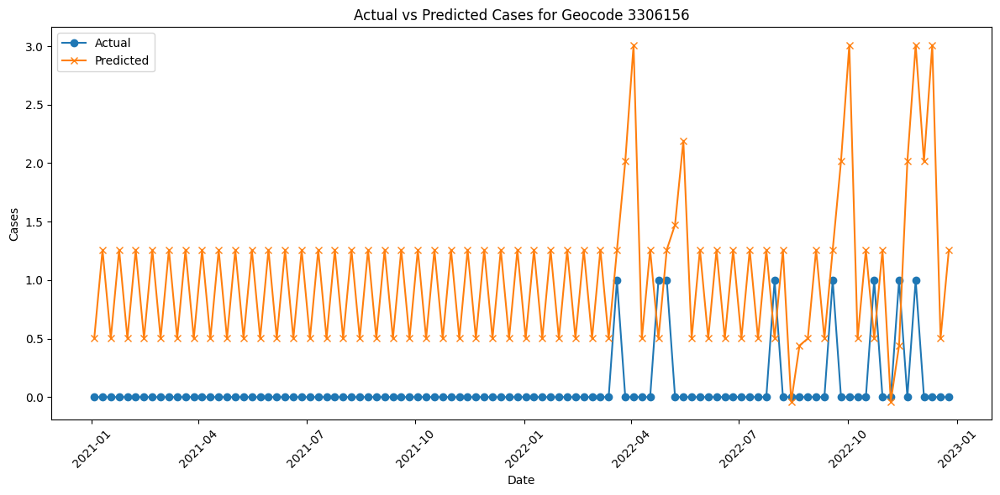

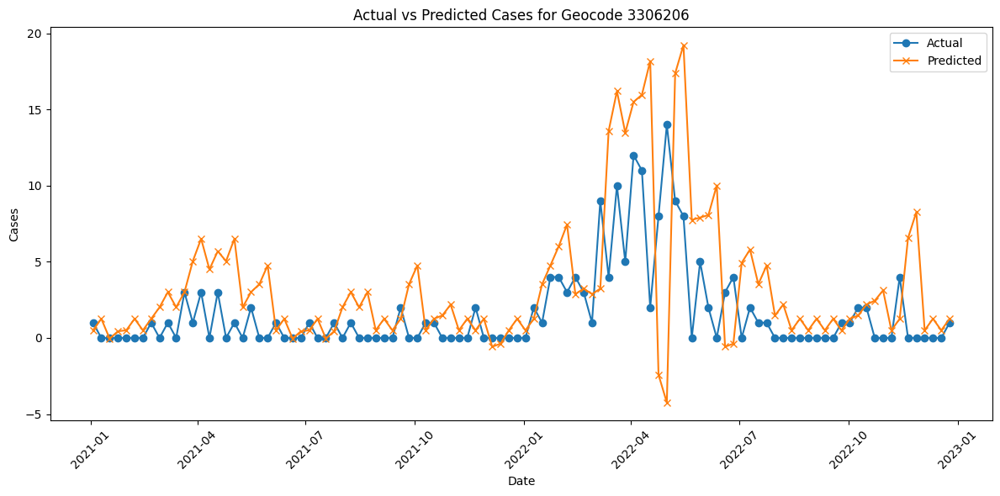

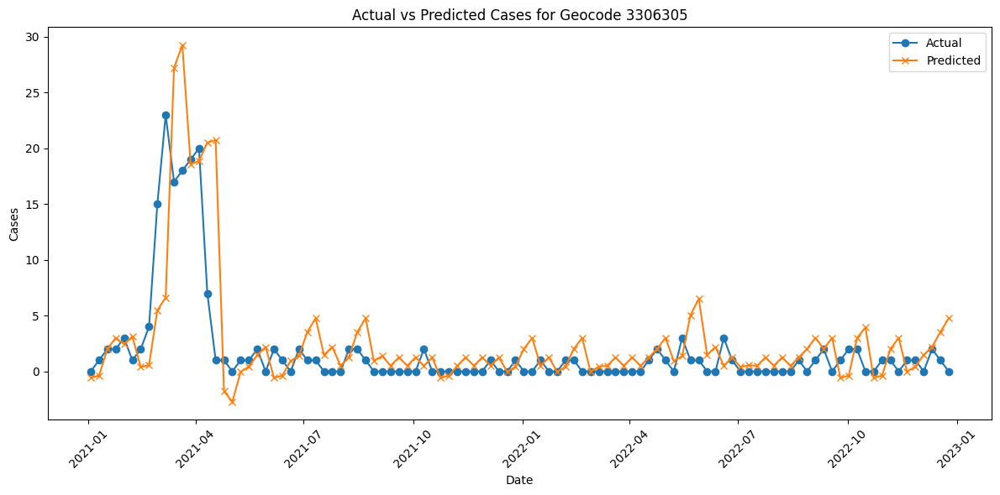

In [272]:
import pandas as pd
import numpy as np
from linearmodels.panel import PooledOLS
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

# Load the data
df = pd.read_csv('final_combined_dataset.csv', parse_dates=["date"])

# Drop unnecessary columns
df = df.drop(columns=['nearby_cases_weighted', 'city', 'week', 'population', 'tempe_min', 
                      'humidity_max', 'humidity_min', 'temp_max', 'vim', 'vim_monthly',
                      'precipitation_max_ordinary_kriging', 'precipitation_avg_regression_kriging',
                      'precipitation_max_regression_kriging', 'long', 'lat', 'cases_per_100k',
                      'nearby_cases_weighted', 'humidity_avg', 'temp_avg', 
                      'precipitation_avg_ordinary_kriging'])

# Check stationarity function
def check_stationarity(df):
    stationary_geocodes = []
    non_stationary_geocodes = []

    for geocode in df['geocode'].unique():
        # Filter data for the current geocode
        series = df[df['geocode'] == geocode]['cases']
        
        # Apply ADF test
        result = adfuller(series.dropna())
        
        # Check if p-value is below 0.05 (stationary)
        if result[1] < 0.05:
            stationary_geocodes.append(geocode)
        else:
            non_stationary_geocodes.append(geocode)
    
    print(f"Stationary geocodes: {stationary_geocodes}")
    print(f"Non-stationary geocodes: {non_stationary_geocodes}")

check_stationarity(df)

# Define the train-test split based on dates
df['date'] = pd.to_datetime(df['date'])
df.set_index(['geocode', 'date'], inplace=True)
# Prepare the training data: add lagged features
df['cases_lag1'] = df.groupby('geocode')['cases'].shift(1)
df['cases_lag2'] = df.groupby('geocode')['cases'].shift(2)# Split data into train and test based on the date

df.dropna(inplace=True)

train_data = df[df.index.get_level_values('date') < '2021']
#test data also has cases , lag-1 and lag-2
test_data = df[df.index.get_level_values('date') >= '2021']


# Check the shape of train and test data
print(f"Train data shape: {train_data.shape}")
print(f"Test data shape: {test_data.shape}")

# Define dependent and independent variables for training
y_train = train_data['cases']
X_train = sm.add_constant(train_data[['cases_lag1', 'cases_lag2']])  # Add both lagged variables

# Fit the model using PooledOLS
model = PooledOLS(y_train, X_train)
result = model.fit()

# Print model summary
print(result.summary)

y_test = test_data['cases']
X_test = sm.add_constant(test_data[['cases_lag1', 'cases_lag2']])  # Add both lagged variables


# Define the forecast horizon (2 weeks ahead)
forecast_horizon = 2
#  First, let's check what we're actually getting from the test data


predictions = []

# Loop through each geocode in test data
for geocode in test_data.index.get_level_values('geocode').unique():
    # Get test data for one geocode
    geocode_data = test_data.xs(geocode, level='geocode')
    
    # Iterate through the data with steps of 2
    for i in range(0, len(geocode_data), 2):
            # Get lag values and print them to verify
            lag1 = geocode_data.iloc[i]['cases_lag1']
            lag2 = geocode_data.iloc[i]['cases_lag2']
            current_date = geocode_data.index[i]
            
            next_date = current_date + pd.Timedelta(days=7)
            
            # Create prediction DataFrame with exact same structure as training
            X_test_week1 = pd.DataFrame({
                'const': [1.0],  # Make sure this is float
                'cases_lag1': [float(lag1)],  # Convert to float
                'cases_lag2': [float(lag2)]   # Convert to float
            }, index=pd.MultiIndex.from_tuples([(geocode, current_date)], 
                                             names=['geocode', 'date']))
            
        
            forecast_week1 = result.predict(X_test_week1).iloc[0]            
            # Second week prediction
            X_test_week2 = pd.DataFrame({
                'const': [1.0],
                'cases_lag1': [float(forecast_week1)],
                'cases_lag2': [float(lag1)]
            }, index=pd.MultiIndex.from_tuples([(geocode, next_date)], 
                                             names=['geocode', 'date']))
            
            forecast_week2 = result.predict(X_test_week2).iloc[0]
            
            # Store predictions
            predictions.extend([
                {
                    'geocode': geocode,
                    'date': current_date,
                    'predicted_cases': forecast_week1,
                    'actual_cases': geocode_data.iloc[i]['cases'] if i < len(geocode_data) else None
                },
                {
                    'geocode': geocode,
                    'date': next_date,
                    'predicted_cases': forecast_week2,
                    'actual_cases': geocode_data.iloc[i+1]['cases'] if i+1 < len(geocode_data) else None
                }
            ])
            

# Convert predictions to DataFrame
predicted_df = pd.DataFrame(predictions)

print(predicted_df)
# Calculate evaluation metrics
predicted_df['error'] = predicted_df['actual_cases'] - predicted_df['predicted_cases']
predicted_df['abs_error'] = abs(predicted_df['error'])
predicted_df['squared_error'] = predicted_df['error'] ** 2

# Print overall metrics
print("\nEvaluation Metrics:")
print(f"Mean Absolute Error: {predicted_df['abs_error'].mean():.2f}")
print(f"Root Mean Squared Error: {np.sqrt(predicted_df['squared_error'].mean()):.2f}")

# Optional: Create visualization
import matplotlib.pyplot as plt

def plot_predictions(geocode):
    geocode_data = predicted_df[predicted_df['geocode'] == geocode]
    plt.figure(figsize=(12, 6))
    plt.plot(geocode_data['date'], geocode_data['actual_cases'], label='Actual', marker='o')
    plt.plot(geocode_data['date'], geocode_data['predicted_cases'], label='Predicted', marker='x')
    plt.title(f'Actual vs Predicted Cases for Geocode {geocode}')
    plt.xlabel('Date')
    plt.ylabel('Cases')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Plot for the first geocode as an example
for geocode in predicted_df['geocode'].unique():
    plot_predictions(geocode)
